# Credit Card User Segmentation 

CUST_ID : Identification of Credit Card holder (Categorical)

BALANCE : Balance amount left in their account to make purchases 

BALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 =
frequently updated, 0 = not frequently updated)

PURCHASES : Amount of purchases made from account

ONEOFF_PURCHASES : Maximum purchase amount done in one-go

INSTALLMENTS_PURCHASES : Amount of purchase done in installment

CASH_ADVANCE : Cash in advance given by the user

PURCHASES_FREQUENCY : How frequently the Purchases are being made, score between 0
and 1 (1 = frequently purchased, 0 = not frequently purchased)

ONEOFFPURCHASESFREQUENCY : How frequently Purchases are happening in one-go (1 =
frequently purchased, 0 = not frequently purchased)

PURCHASESINSTALLMENTSFREQUENCY : How frequently purchases in installments are
being done (1 = frequently done, 0 = not frequently done)

CASHADVANCEFREQUENCY : How frequently the cash in advance being paid

CASHADVANCETRX : Number of Transactions made with "Cash in Advanced"

PURCHASES_TRX : Number of purchase transactions made

CREDIT_LIMIT : Limit of Credit Card for user

PAYMENTS : Amount of Payment done by user

MINIMUM_PAYMENTS : Minimum amount of payments made by user

PRCFULLPAYMENT : Percent of full payment paid by user

TENURE : Tenure of credit card service for user

In [1]:
import pandas as pd
import numpy as np 

import matplotlib.pyplot as plt 
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns


from sklearn.decomposition import PCA 
import umap

from sklearn.preprocessing import StandardScaler, normalize
from sklearn import metrics
from sklearn.metrics import silhouette_score

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture

from sklearn import cluster 
from sklearn.cluster import SpectralClustering



import warnings
warnings.filterwarnings("ignore")

In [2]:
df_creditcard = pd.read_csv(".../cc_info.csv")

In [3]:
df_creditcard

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [4]:
#drop CUST_ID from the dataframe
df_creditcard.drop("CUST_ID", axis=1, inplace=True)

In [10]:
df_creditcard.info() #null quantities in CREDIT_LIMIT and MINIMUM_PAYMENTS                  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CREDIT

In [27]:
df_creditcard.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [5]:
# handling null values
df_creditcard["CREDIT_LIMIT"] = df_creditcard["CREDIT_LIMIT"].fillna(df_creditcard.CREDIT_LIMIT.median())
df_creditcard["MINIMUM_PAYMENTS"] = df_creditcard["MINIMUM_PAYMENTS"].fillna(df_creditcard.MINIMUM_PAYMENTS.median())

In [29]:
df_creditcard["CREDIT_LIMIT"]

0       1000.0
1       7000.0
2       7500.0
3       7500.0
4       1200.0
         ...  
8945    1000.0
8946    1000.0
8947    1000.0
8948     500.0
8949    1200.0
Name: CREDIT_LIMIT, Length: 8950, dtype: float64

In [31]:
df_creditcard.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [39]:
df_creditcard.dtypes

CUST_ID                              object
BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

In [32]:
df_creditcard.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.282473,1733.143852,844.906767,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.646702,2895.063757,2332.792322,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,170.857654,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,788.713501,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [6]:
df_creditcard[['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES','ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE','PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
    'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
    'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']].nunique()

BALANCE                             8871
BALANCE_FREQUENCY                     43
PURCHASES                           6203
ONEOFF_PURCHASES                    4014
INSTALLMENTS_PURCHASES              4452
CASH_ADVANCE                        4323
PURCHASES_FREQUENCY                   47
ONEOFF_PURCHASES_FREQUENCY            47
PURCHASES_INSTALLMENTS_FREQUENCY      47
CASH_ADVANCE_FREQUENCY                54
CASH_ADVANCE_TRX                      65
PURCHASES_TRX                        173
CREDIT_LIMIT                         205
PAYMENTS                            8711
MINIMUM_PAYMENTS                    8636
PRC_FULL_PAYMENT                      47
TENURE                                 7
dtype: int64

RuntimeError: Selected KDE bandwidth is 0. Cannot estiamte density.

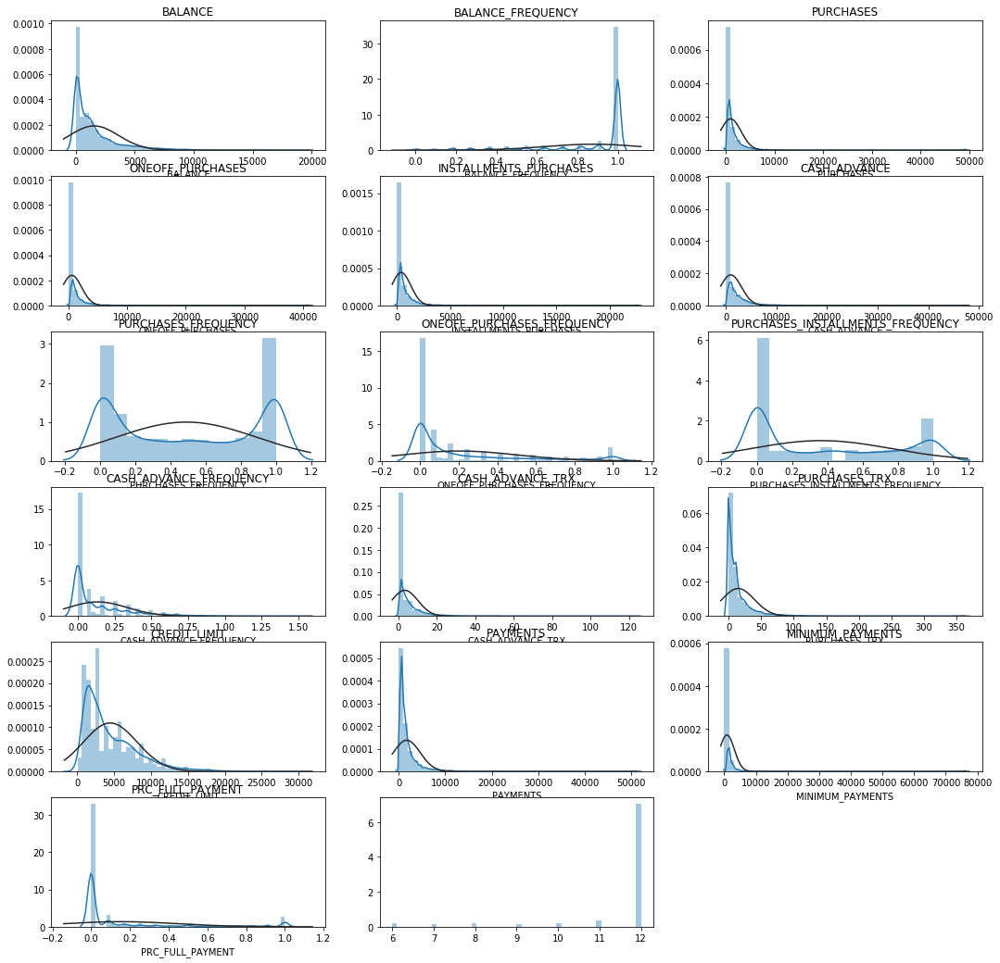

In [37]:
from scipy.stats import norm 

graph_by_variables = ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']
plt.figure(figsize=(18,18))

for i in range(0,17):
    plt.subplot(6,3,i+1)
    sns.distplot(df_creditcard[graph_by_variables[i]],fit=norm)
    plt.title(graph_by_variables[i])

plt.tight_layout()
    

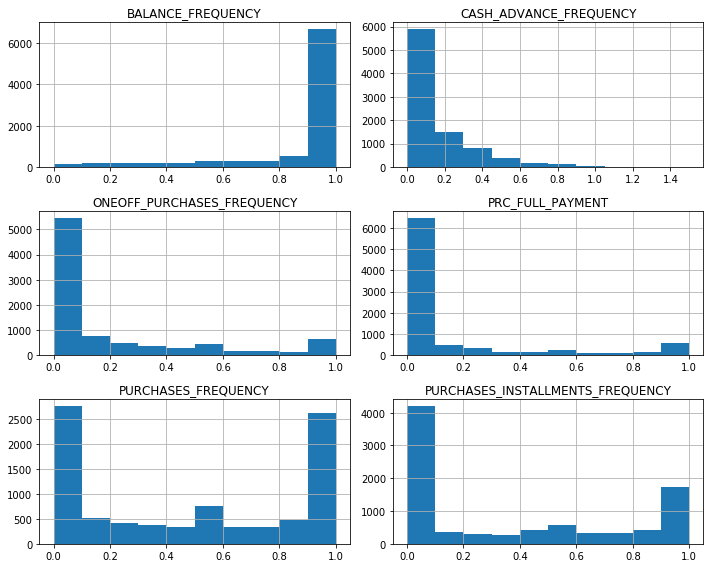

In [38]:
#Frequency variables

df_creditcard[['BALANCE_FREQUENCY',
 'PURCHASES_FREQUENCY',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'CASH_ADVANCE_FREQUENCY',
'PRC_FULL_PAYMENT']].hist(figsize=(10,8))
plt.tight_layout()

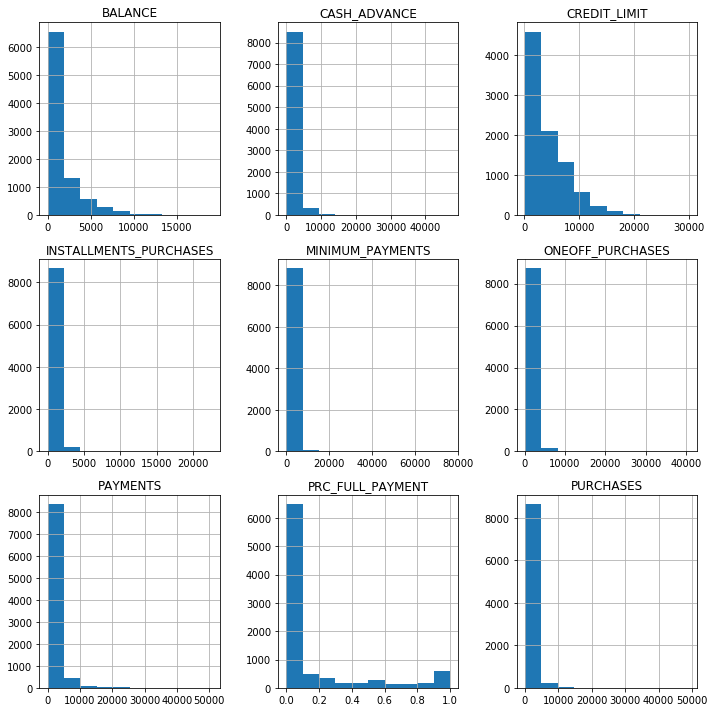

In [40]:
df_creditcard[['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES','INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
    'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT']].hist(figsize=(10,10))

plt.tight_layout()

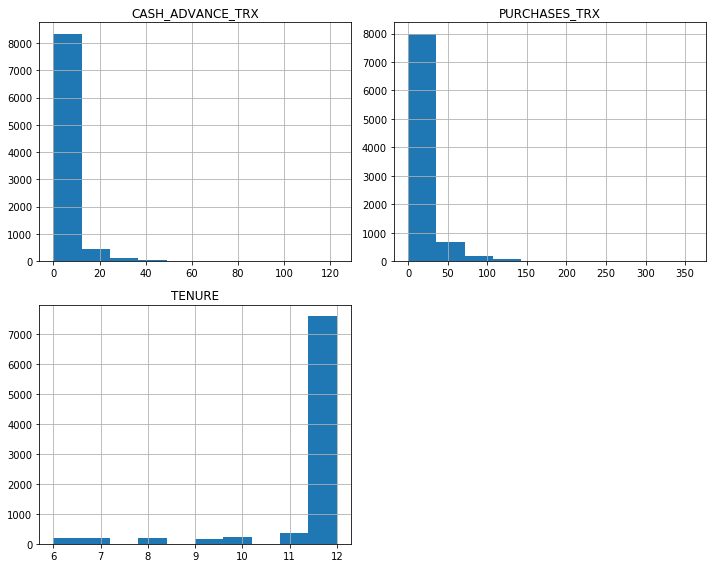

In [42]:
#int. values in histogram

df_creditcard[['TENURE','CASH_ADVANCE_TRX', 'PURCHASES_TRX']].hist(figsize=(10,8))
plt.tight_layout()

Text(0, 0.5, 'BALANCE')

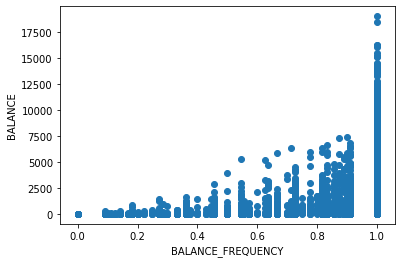

In [44]:
plt.scatter(df_creditcard['BALANCE_FREQUENCY'], df_creditcard['BALANCE'])
plt.xlabel('BALANCE_FREQUENCY')
plt.ylabel('BALANCE')

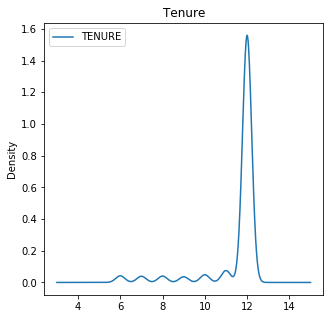

In [45]:
df_creditcard[['TENURE']].plot.kde(figsize=(5,5),title='Tenure')

Text(0.5, 1, 'Correlation Matrix')

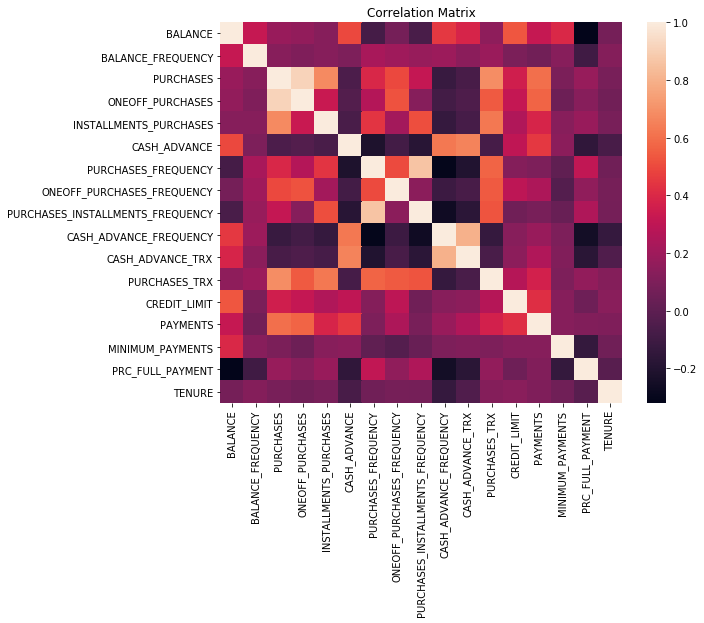

In [49]:
plt.figure(figsize=(9,7))
sns.heatmap(df_creditcard.corr())

plt.title('Correlation Matrix')

Balance has a higher level of correlation with Cash Advance, Cash Advance Frequency and Credit Limit. Payments variable has a high correletion with Purchases and one off Purchases. Tenure has a negative correlation with Cash Advance and Cash Advance Frequency variables.

In [51]:
corr = df_creditcard.corr()
corr.style.background_gradient()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
BALANCE,1.000000,0.322412,0.181261,0.164350,0.126469,0.496692,-0.077944,0.073166,-0.063186,0.449218,0.385152,0.154338,0.531296,0.322802,0.397920,-0.318959,0.072692
BALANCE_FREQUENCY,0.322412,1.000000,0.133674,0.104323,0.124292,0.099388,0.229715,0.202415,0.176079,0.191873,0.141555,0.189626,0.095931,0.065008,0.131181,-0.095082,0.119776
PURCHASES,0.181261,0.133674,1.000000,0.916845,0.679896,-0.051474,0.393017,0.498430,0.315567,-0.120143,-0.067175,0.689561,0.356977,0.603264,0.095789,0.180379,0.086288
ONEOFF_PURCHASES,0.164350,0.104323,0.916845,1.000000,0.330622,-0.031326,0.264937,0.524891,0.127729,-0.082628,-0.046212,0.545523,0.319735,0.567292,0.050256,0.132763,0.064150
INSTALLMENTS_PURCHASES,0.126469,0.124292,0.679896,0.330622,1.000000,-0.064244,0.442418,0.214042,0.511351,-0.132318,-0.073999,0.628108,0.256515,0.384084,0.134019,0.182569,0.086143
CASH_ADVANCE,0.496692,0.099388,-0.051474,-0.031326,-0.064244,1.000000,-0.215507,-0.086754,-0.177070,0.628522,0.656498,-0.075850,0.303997,0.453238,0.140747,-0.152935,-0.068312
PURCHASES_FREQUENCY,-0.077944,0.229715,0.393017,0.264937,0.442418,-0.215507,1.000000,0.501343,0.862934,-0.308478,-0.203478,0.568430,0.119833,0.103464,0.006154,0.305802,0.061506
ONEOFF_PURCHASES_FREQUENCY,0.073166,0.202415,0.498430,0.524891,0.214042,-0.086754,0.501343,1.000000,0.142329,-0.111716,-0.069088,0.544869,0.295059,0.243537,-0.027311,0.157531,0.082466
PURCHASES_INSTALLMENTS_FREQUENCY,-0.063186,0.176079,0.315567,0.127729,0.511351,-0.177070,0.862934,0.142329,1.000000,-0.262958,-0.169207,0.529975,0.060794,0.085551,0.032055,0.250087,0.073275
CASH_ADVANCE_FREQUENCY,0.449218,0.191873,-0.120143,-0.082628,-0.132318,0.628522,-0.308478,-0.111716,-0.262958,1.000000,0.799561,-0.131168,0.132608,0.183192,0.100616,-0.249773,-0.133372


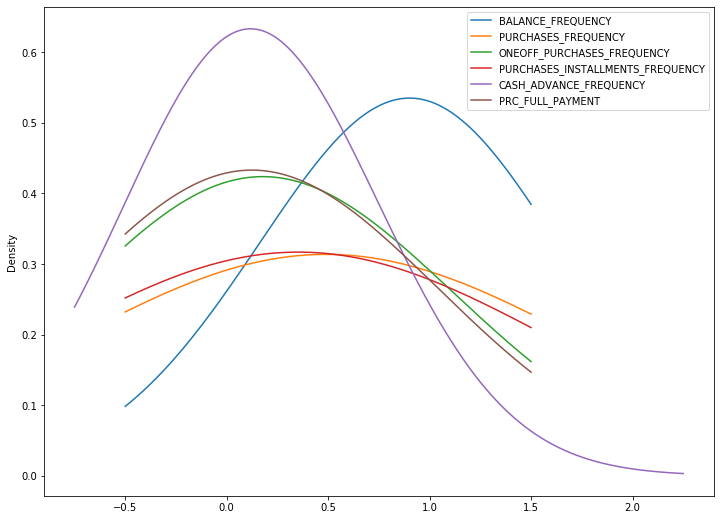

In [52]:
ax = df_creditcard[['BALANCE_FREQUENCY', 'PURCHASES_FREQUENCY',
         'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
         'CASH_ADVANCE_FREQUENCY','PRC_FULL_PAYMENT']].plot.kde(figsize=(12,9), bw_method=3) #,ind=[0, 2, 3,4]

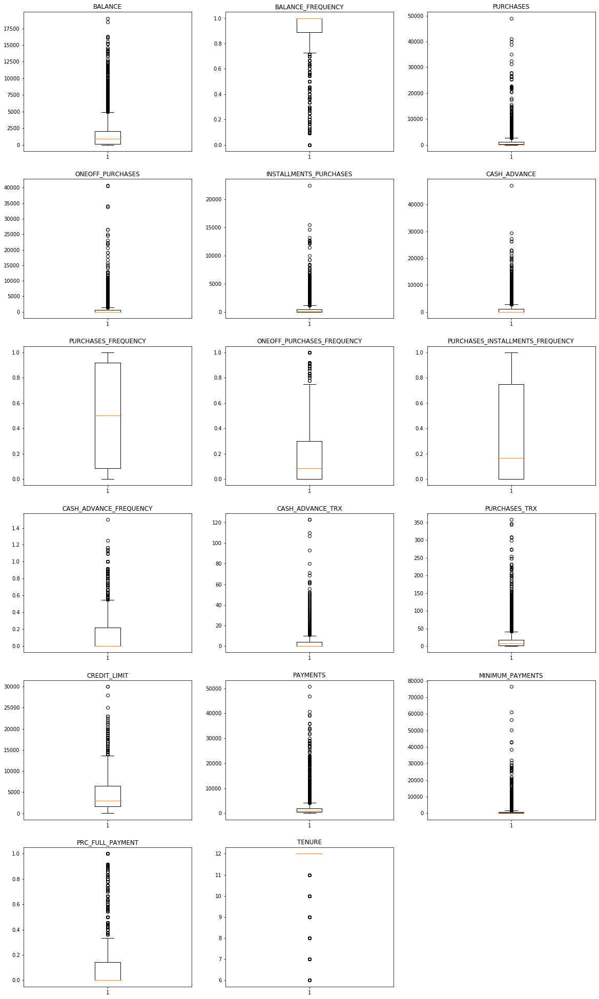

In [53]:
plt.figure(figsize=(20,35))

for i in range(0,17):
    plt.subplot(6, 3, i+1)
    plt.boxplot(df_creditcard[graph_by_variables[i]].dropna())
    plt.title(graph_by_variables[i])

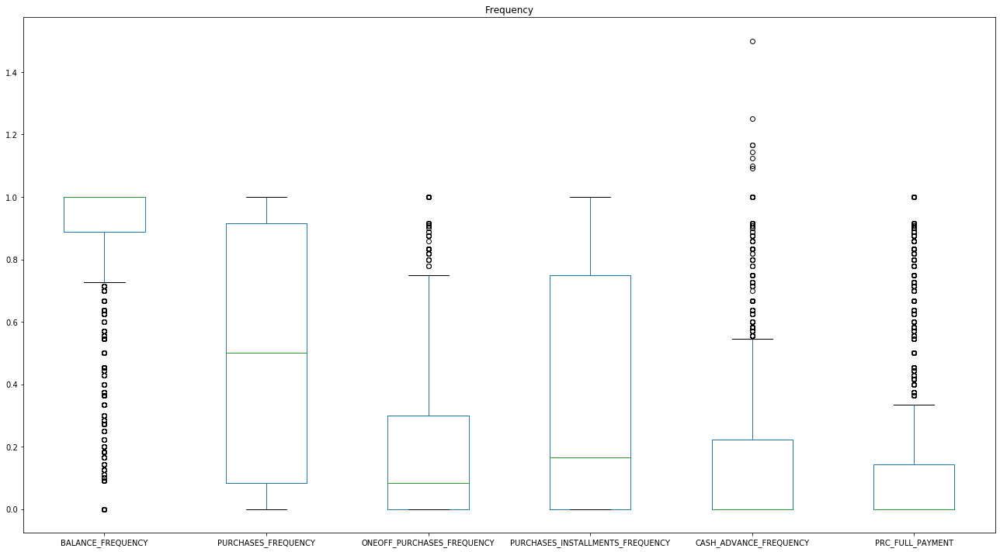

In [54]:
# checking outliars

df_creditcard[['BALANCE_FREQUENCY',
 'PURCHASES_FREQUENCY',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'CASH_ADVANCE_FREQUENCY',
'PRC_FULL_PAYMENT']].plot.box(figsize=(18,10),title='Frequency',legend=True);
plt.tight_layout()
#tight_layout automatically adjusts subplot params so that the subplot(s) fits in to the figure area

## Clustering 

In [66]:
scaler = StandardScaler()
df_creditcard_std = scaler.fit_transform(df_creditcard)

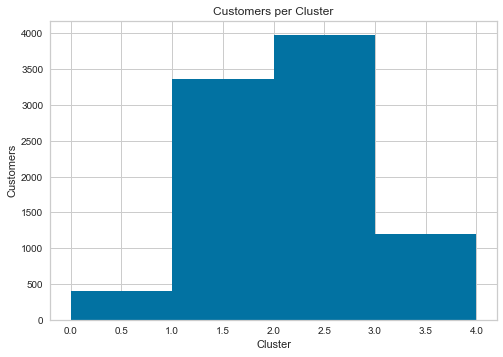

In [68]:
# Custumers per cluster

n_clusters = 4

clustering = KMeans(n_clusters=n_clusters,random_state=0)

cluster_labels = clustering.fit_predict(df_creditcard_std)

# plot cluster sizes

plt.hist(cluster_labels, bins=range(n_clusters+1))
plt.title ('Customers per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Customers')
plt.show()

Determining Number of Clusters with Elbow Method

In [69]:
scores = []
cluster_list = range(1, 11)
for i in cluster_list :
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 40)
    kmeans.fit(df_creditcard_std)
    scores.append(kmeans.inertia_)

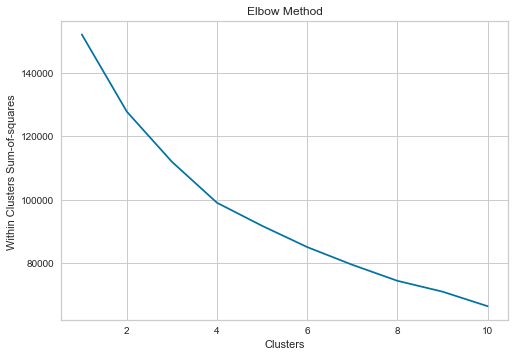

In [72]:
plt.plot(cluster_list, scores)
plt.title('Elbow Method')
plt.xlabel('Clusters')
plt.ylabel('Within Clusters Sum-of-squares ')
plt.show()

Determining Number of Clusters with Silhouette Scores Method

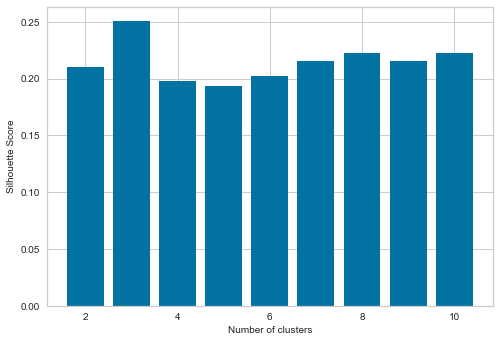

In [73]:
silhouette_scores = [] 

for n_cluster in range(2, 11):
    silhouette_scores.append( 
        silhouette_score(df_creditcard_std, KMeans(n_clusters = n_cluster).fit_predict(df_creditcard_std))) 
    
# Plotting a bar graph to compare the results 
k = [2, 3, 4, 5, 6,7,8,9,10] 
plt.bar(k, silhouette_scores) 
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10) 
plt.show()

Kmeans with a variety of cluster sizes

In [74]:
# kmeans_values=[]

# for cluster in range(2,20):
#     kmeans = KMeans(n_clusters=cluster, random_state=40).fit_predict(df_creditcard_std)
#     sil_score = metrics.silhouette_score(df_creditcard_std,kmeans, metric='euclidean')
#     print("Silhouette score for {} cluster k-means: {:.3f}".format(cluster,
#                                                                metrics.silhouette_score(df_creditcard_std, kmeans, metric='euclidean')))
#     kmeans_values.append((cluster,sil_score))

I am going to test 3 clusters

In [156]:
kmeans3_ = KMeans(n_clusters=3, random_state=40).fit(df_creditcard_std)

In [ ]:
#Heirarchical Clustering

In [142]:
# silhouette_list_hierarchical = []

# for cluster in range(2,10,1):
#     for linkage_method in ['ward', 'average', 'complete']:
#         agglomerative = AgglomerativeClustering(linkage=linkage_method, affinity='euclidean',n_clusters=cluster).fit_predict(df_creditcard_std)
#         sil_score = metrics.silhouette_score(df_creditcard_std, agglomerative, metric='euclidean')
#         silhouette_list_hierarchical.append((cluster, sil_score, linkage_method, len(set(agglomerative)) ) )
        
# df_hierarchical = pd.DataFrame(silhouette_list_hierarchical, columns=['cluster', 'sil_score','linkage_method', 'number_of_clusters'])

In [ ]:
#The silhouette score for 3 clusters from the Agglomerative Clustering solution: 0.813	
#The silhouette score for 8 clusters from the Agglomerative Clustering solution: 0.715

## DBScan
DBSCAN is a clustering method that is used in machine learning to separate clusters of high density from clusters of low density. Given that DBSCAN is a density based clustering algorithm, it does a great job of seeking areas in the data that have a high density of observations, versus areas of the data that are not very dense with observations. 

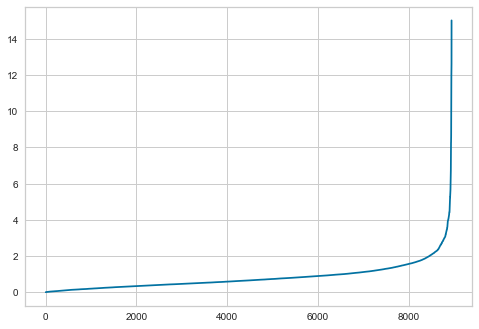

In [144]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_creditcard_std)
distances, indices = nbrs.kneighbors(df_creditcard_std)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [148]:
silhouette_list_dbscan = []

for eps in np.arange(0.1,2,0.2):
    for min_sample in range(1,10):
        dbscan = DBSCAN(eps=eps, min_samples= min_sample)
        dbscan.fit(df_creditcard_std)
        sil_score = metrics.silhouette_score(df_creditcard_std, dbscan.labels_, metric='euclidean')
        silhouette_list_dbscan.append((eps, min_sample, sil_score, len(set(dbscan.labels_))) )
        
df_dbscan = pd.DataFrame(silhouette_list_dbscan, columns=['eps', 'min_samples', 'sil_score', 'number_of_clusters'])

In [150]:
df_dbscan.sort_values('sil_score', ascending=False)

,eps,min_samples,sil_score,number_of_clusters
85,1.9,5,0.462031,2
86,1.9,6,0.456168,2
87,1.9,7,0.450594,2
88,1.9,8,0.447102,2
89,1.9,9,0.442987,2
...,...,...,...,...
29,0.7,3,-0.514324,103
21,0.5,4,-0.515081,61
19,0.5,2,-0.519648,342
28,0.7,2,-0.519969,330


This method seems not a suitable one for our desired model even with a high silhouette score. There are a high number of variables in the same cluster itself but distribution of variables does not distributes homogenous in all clusters.

## Gaussian Mixture Models
Gaussian mixture models can handle even very oblong clusters. Therefore, I also would like to check this method to see the results of an unsupervised machine learning purpose. (K-means does not account for variance)

In [152]:
silhouette_list_GMM = []

for cluster in range(2,21,2):
    for covariance_type in ['full', 'tied', 'diag', 'spherical']:
        gmm  = GaussianMixture(n_components = cluster,covariance_type = covariance_type, random_state = 40).fit_predict(df_creditcard_std)
        sil_score = metrics.silhouette_score(df_creditcard_std, gmm, metric='euclidean')
        silhouette_list_GMM.append((cluster, sil_score, covariance_type, len(set(gmm)) ) )
        
df_gmm = pd.DataFrame(silhouette_list_GMM, columns=['cluster', 'sil_score','covariance_type', 'number_of_clusters'])

In [155]:
df_gmm.sort_values('sil_score', ascending=False)

,cluster,sil_score,covariance_type,number_of_clusters
3,2,0.224797,spherical,2
37,20,0.208173,tied,20
33,18,0.205985,tied,18
29,16,0.204951,tied,16
21,12,0.202195,tied,12
25,14,0.192088,tied,14
1,2,0.191869,tied,2
17,10,0.191071,tied,10
13,8,0.190835,tied,8
5,4,0.190710,tied,4


Silhouette scores are very low. Spherical covariance type worked better in the model in 10 clusters.

Many features, may require dimension reduction! 
## PCA
Kmeans performed well upon evaluating the different methods. I am testing 3 and 8 clusters.

PCA will be used in the following sections to reduce the dimensions and understand the clusters.

In [35]:
df_norm = (df_creditcard-df_creditcard.mean())/df_creditcard.std()

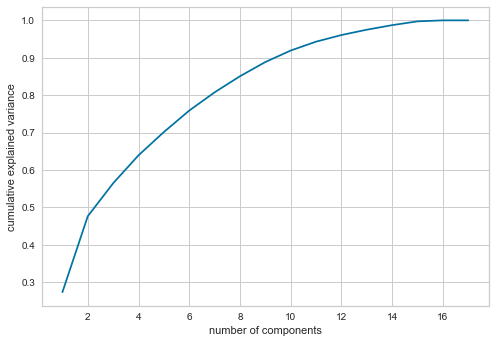

In [36]:
from sklearn.decomposition import PCA
pca = PCA().fit(df_norm)
plt.plot(range(1, 18), np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

2 components explained significant variance

Since the data is for a financial firm, the culture is quantifying uncertainty and therefore let's make decisions based on probabilities, so let's use a Gaussian Mixture Model
(GMM)

In [37]:
from sklearn.mixture import GaussianMixture
C = np.zeros((8, 8))
for i, pca_c in enumerate(range(2, 10)):
    pca = PCA(n_components=pca_c).fit(df_norm)
    Xpca = pca.transform(df_norm)
    for j, gm_c in enumerate(range(2, 10)):
        gm = GaussianMixture(n_components=gm_c, random_state=42)
        gm.fit(Xpca)
        C[i,j] = gm.bic(Xpca)

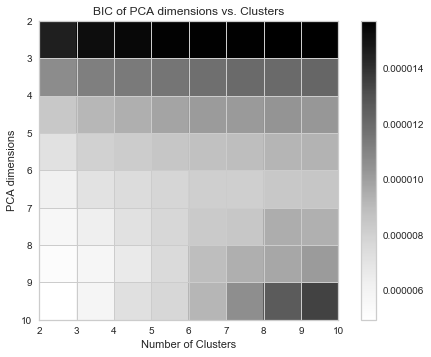

In [38]:
plt.imshow(1/C, extent=[2,10,10,2])
plt.xlabel('Number of Clusters')
plt.ylabel('PCA dimensions')
plt.title("BIC of PCA dimensions vs. Clusters")
plt.colorbar()

We want to understand what the tradeoff between number of cluster in our GMM fit and
PCA dimensions. Higher is better.
The image above is of the GMM model fit for PCA dimensions relateive to the number of clusters chosen for
the GMM.
There seems to be no advantage to selecting anymore than 2 dimensions in the PCA.

Text(0.5, 0, 'Number of Clusters')

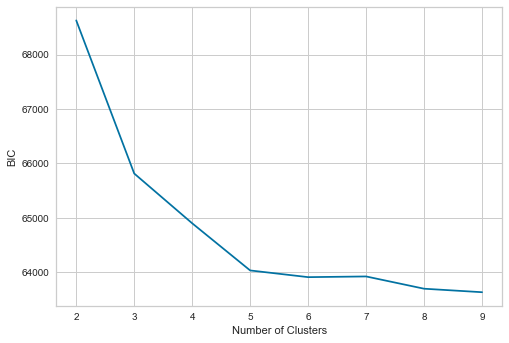

In [39]:
plt.plot(range(2, 10), C[0,:])
plt.ylabel("BIC")
plt.xlabel("Number of Clusters")

We can choose the number of clusters where the gradient of this curve is near 0. This
appears to be right around 5, so we will use that many clusters.

In [55]:
from matplotlib.patches import Ellipse

def draw_ellipse(position, covariance, ax=None, **kwargs):
    ax = ax or plt.gca()
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)

    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                            angle, **kwargs))

def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
        ax.axis('equal')
        
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor)

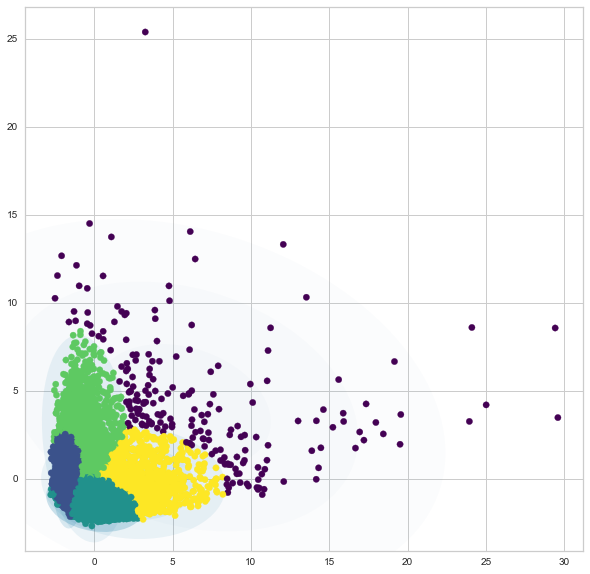

In [56]:
pca = PCA(n_components=2).fit(df_norm)
Xpca = pca.transform(df_norm)
plt.figure(figsize=(10,10))
gmm = GaussianMixture(n_components=5, random_state=42)
plot_gmm(gmm, Xpca)

We see that the clusters are not very far from each other and tend to overlap.
Interpretive caution needs to be taken, so let us inspect these centroids and whether
there's anything we can interpret from them.

In [57]:
pca = PCA(n_components=2).fit(df_norm)
Xpca = pca.transform(df_norm)
gm = GaussianMixture(n_components=5, random_state=42)
clusters = gm.fit_predict(Xpca)

In [58]:
df_hat = df_norm.copy()

df_hat.iloc[:] = pca.inverse_transform(Xpca)

Text(0, 0.5, 'Z-score')

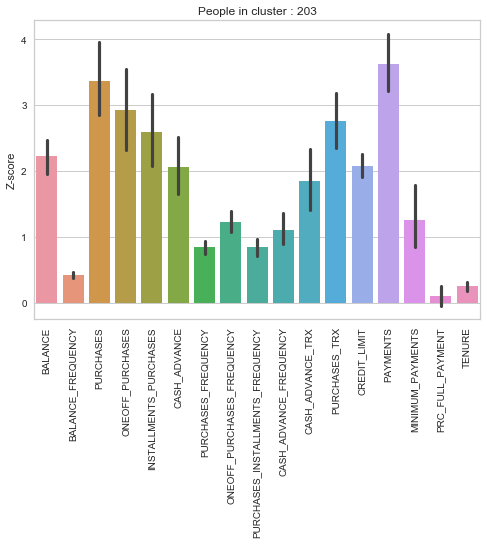

In [59]:
c_num = 0

sns.barplot(data=df_norm[clusters == c_num])
plt.xticks(rotation=90)
plt.title('People in cluster : ' + str(np.sum(clusters == c_num)))
plt.ylabel('Z-score')

## The small loaners
This group appears to make many small, cash advance transactions and use the credit card primarily for that.
There are 2629 people in this group

Text(0, 0.5, 'Z-score')

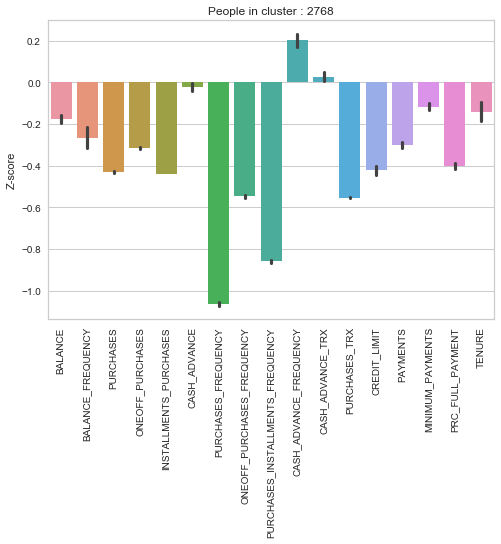

In [61]:
c_num = 1

sns.barplot(data=df_norm[clusters == c_num])
plt.xticks(rotation=90)
plt.title('People in cluster : ' + str(np.sum(clusters == c_num)))
plt.ylabel('Z-score')

## "I want to work on a great credit scrore"
This group appears to carry around little debt, payoff bills in full, have low credit limits, take very few cash advances,
and make many small purchases
There are 3692 people in this group

Text(0, 0.5, 'Z-score')

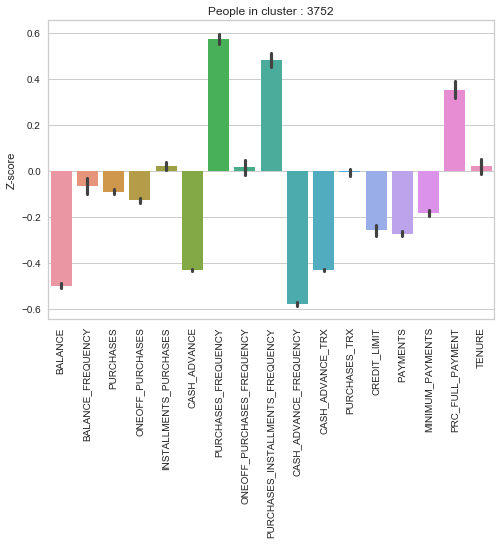

In [62]:
c_num = 2

sns.barplot(data=df_norm[clusters == c_num])
plt.xticks(rotation=90)
plt.title('People in cluster : ' + str(np.sum(clusters == c_num)))
plt.ylabel('Z-score')

## "The high rollers"
This group appears to carry around a huge amount of debt and make very large cash advances.
There are 1210 people in this group

Text(0, 0.5, 'Z-score')

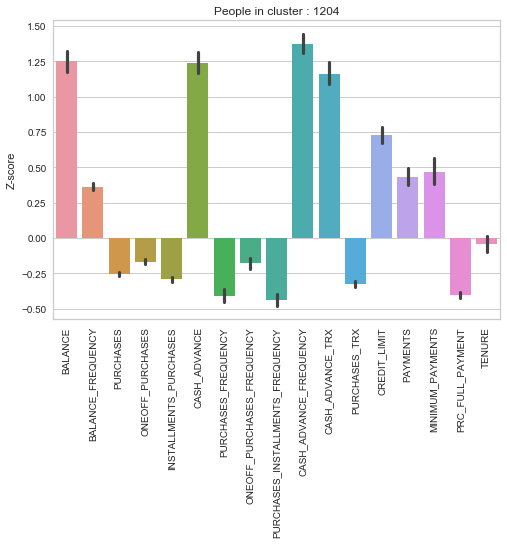

In [63]:
c_num = 3

sns.barplot(data=df_norm[clusters == c_num])
plt.xticks(rotation=90)
plt.title('People in cluster : ' + str(np.sum(clusters == c_num)))
plt.ylabel('Z-score')

## Primary purchaser
This group appears to make many purchases, carry around some debt, not use many cash advances.
There are 923 people in this group

Text(0, 0.5, 'Z-score')

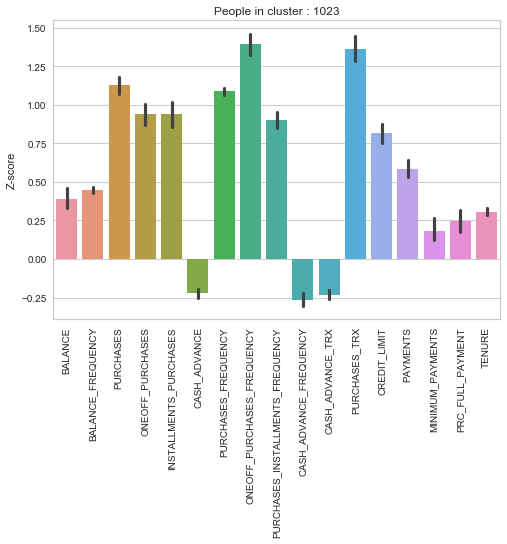

In [64]:
c_num = 4

sns.barplot(data=df_norm[clusters == c_num])
plt.xticks(rotation=90)
plt.title('People in cluster : ' + str(np.sum(clusters == c_num)))
plt.ylabel('Z-score')

In [162]:
# PCA 2 dimensions

pca = PCA(n_components = 5).fit(df_nor)

df_pca = pca.fit_transform(df_nor)
print("original shape:   ", df_nor.shape)
print("transformed shape:", df_pca.shape)

original shape:    (8950, 17)
transformed shape: (8950, 5)


In [164]:
#Result in a DataFrame

df_pca = pd.DataFrame(df_pca) 
df_pca.columns = ['A1', 'A2', 'A3', 'A4', 'A5']
df_pca.head()

,A1,A2,A3,A4,A5
0,-0.490443,-0.679237,-0.098471,0.117099,-0.003687
1,-0.518542,0.545284,0.196785,-0.203078,-0.266833
2,0.330939,0.269024,0.117095,0.746029,0.131461
3,-0.479448,-0.105320,0.457010,0.289606,-0.386771
4,-0.563829,-0.480941,-0.257073,0.324106,0.027696


In [171]:
# plt.scatter(df_pca['A1'], df_pca['A2'],
#             c = KMeans(n_clusters = 3, random_state=40).fit_predict(df_pca2), cmap = None) 
# plt.show()
fig = px.scatter_3d(df_pca, x=df_pca['A1'], y= df_pca['A2'], z=df_pca['A3'], color=df_creditcard['cluster']) 
fig.show()

In [166]:
print(pca.explained_variance_)

[0.28413879 0.18003639 0.10795048 0.097986   0.06912727]


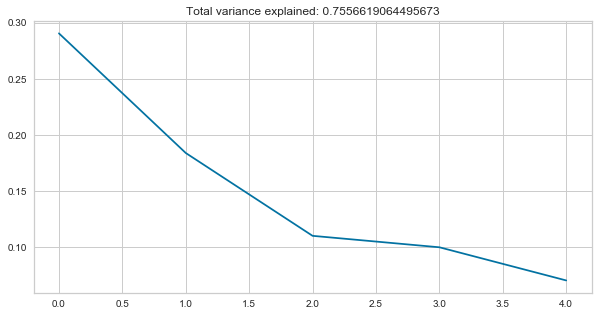

In [167]:
plt.figure(figsize = (10,5))
plt.plot(pca.explained_variance_ratio_)
plt.title('Total variance explained: {}'.format(pca.explained_variance_ratio_.sum()))
plt.show()

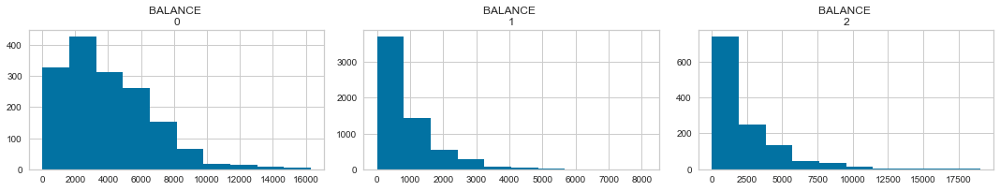

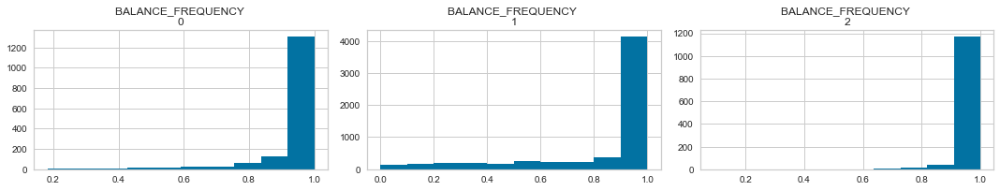

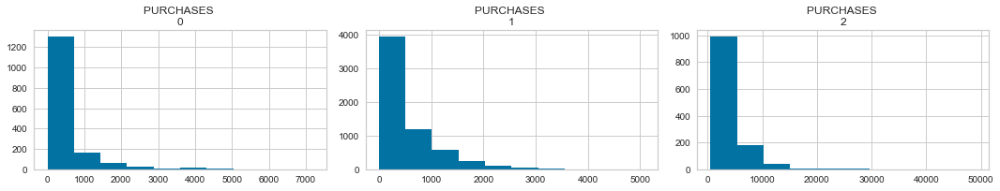

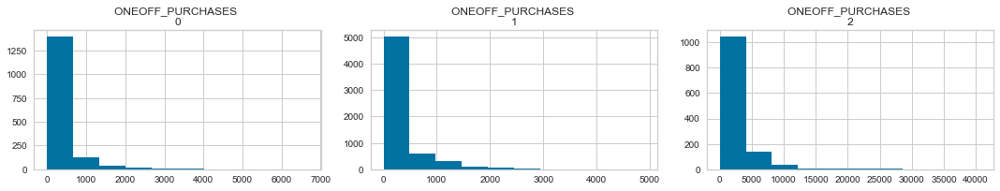

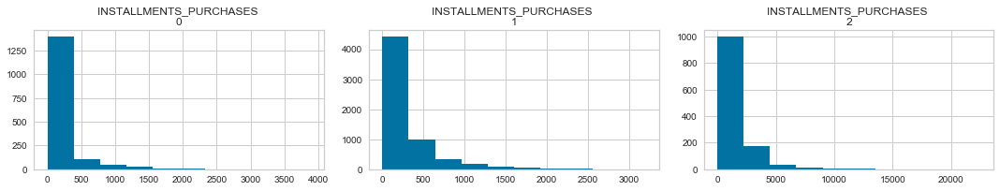

...

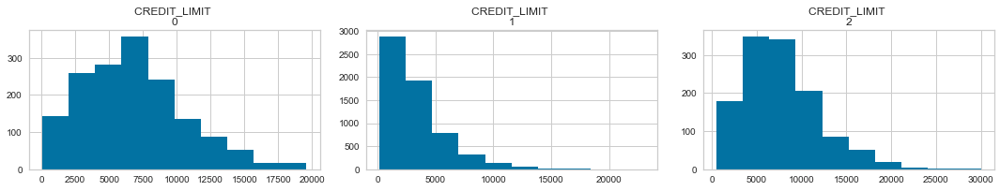

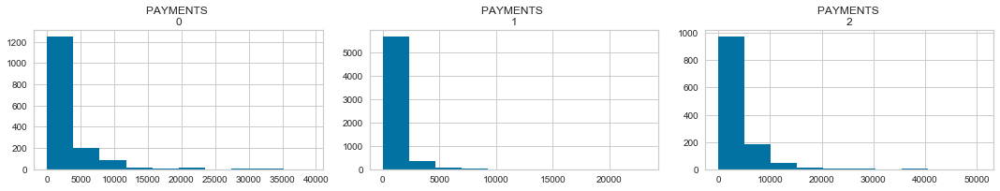

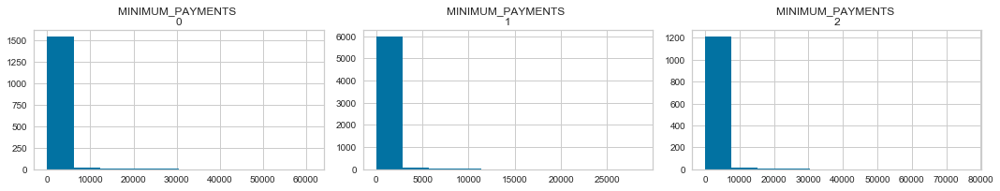

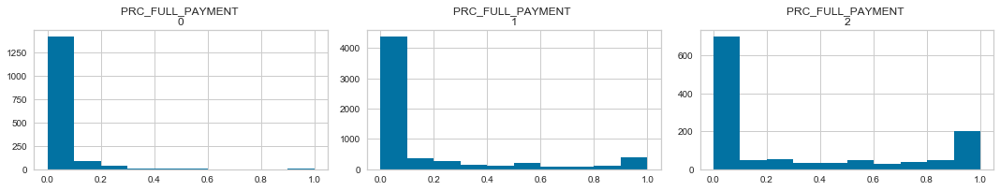

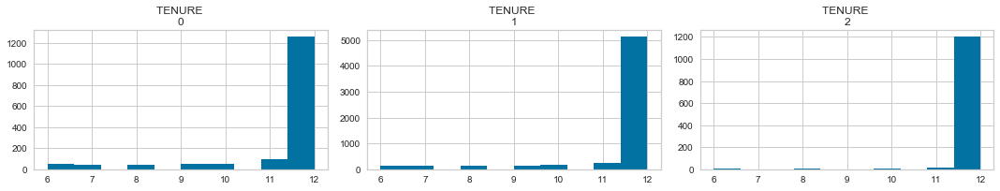

In [178]:
col_list= ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']


for column in col_list:
    plt.figure(figsize=(15,3))
    for i in range(0,3):
        plt.subplot(1,3,i+1)
        cluster = df_creditcard[df_creditcard['cluster']==i]
        cluster[column].hist()
        plt.title('{} \n{}'.format(column, i))
        
    plt.tight_layout()
    plt.show()
    

Text(0, 0.5, 'PAYMENTS')

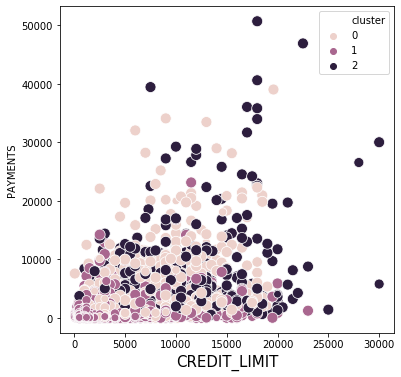

In [90]:
plt.figure(figsize=(6,6))
sns.scatterplot(x='CREDIT_LIMIT', y='PAYMENTS', hue='cluster',data=df_creditcard, s = df_creditcard.TENURE*10);
plt.xlabel('CREDIT_LIMIT',size=15)
#plt.xlim([0,40000])
plt.ylabel('PAYMENTS', size =10)

In [179]:
best_columns = ["BALANCE", "PURCHASES", "CASH_ADVANCE","CREDIT_LIMIT", "PAYMENTS", "MINIMUM_PAYMENTS","PURCHASES_FREQUENCY", "TENURE"]

best_columns.append("cluster")


<Figure size 3600x3600 with 0 Axes>

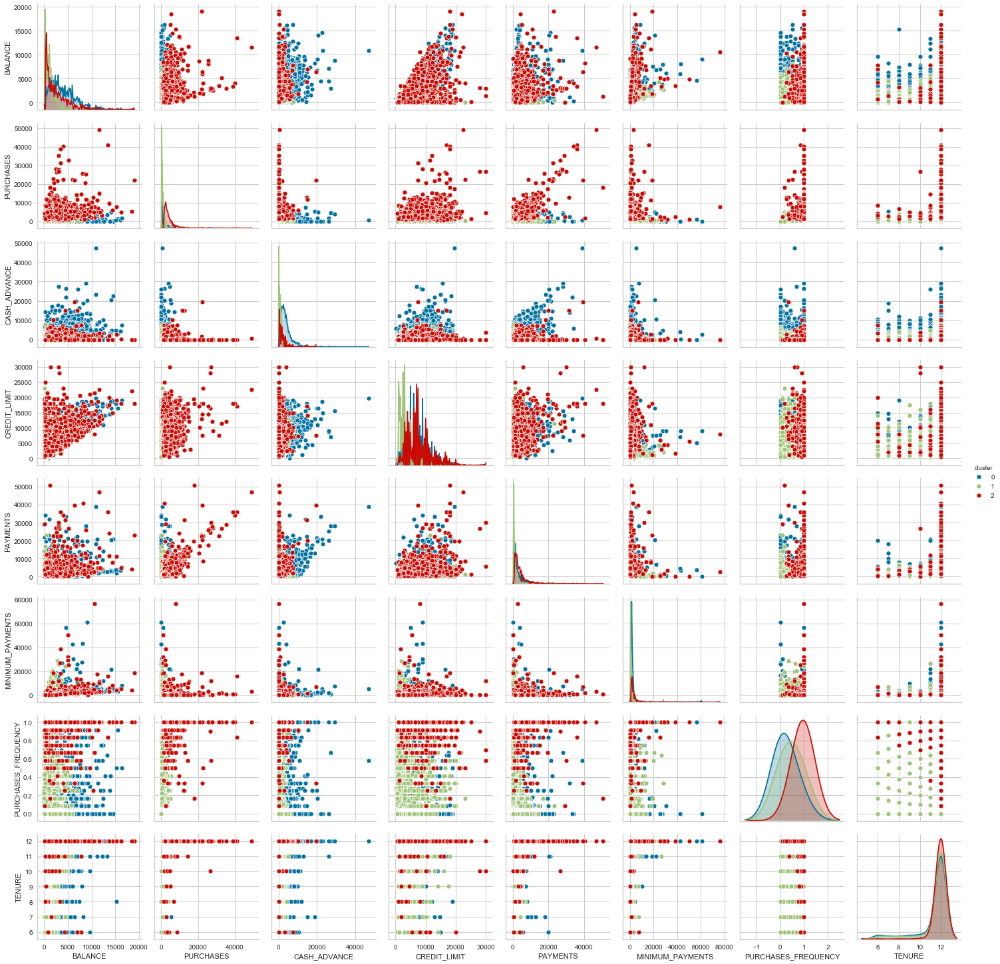

In [180]:
plt.figure(figsize=(50,50))
#sns.PairGrid( df_creditcard[best_columns], hue="cluster")
sns.pairplot( df_creditcard[best_columns], hue="cluster", diag_kws={'bw':0.5})

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


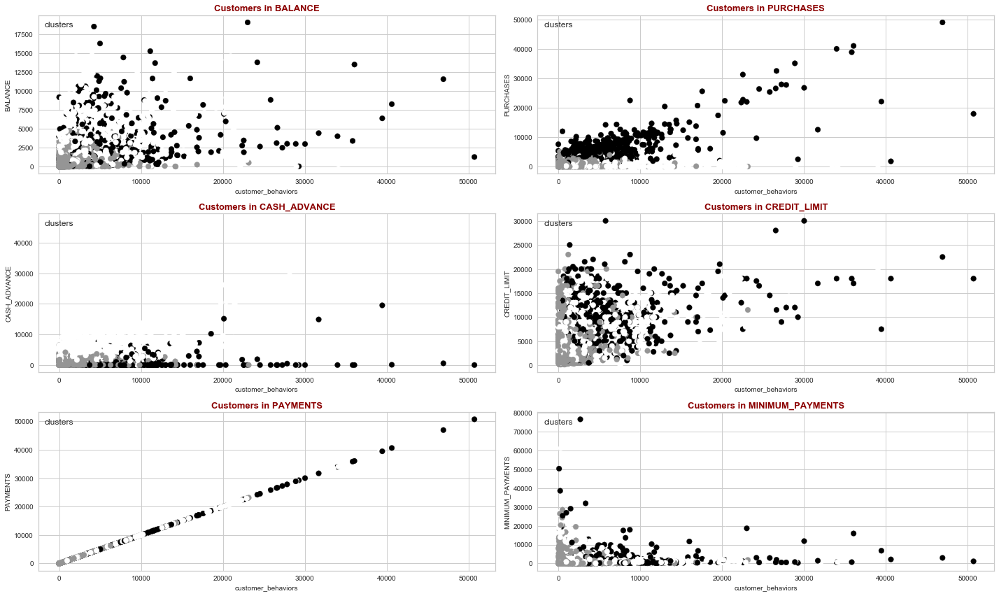

In [185]:
fig, axes = plt.subplots(3,2,figsize=(20,12))
title_font = {'family': 'arial', 'color': 'darkred','weight': 'bold','size': 14 }

for i in range(0,6):
    
    plt.subplot(3, 2, i+1)
    plt.scatter(df_creditcard['PAYMENTS'], df_creditcard[best_columns[i]], c= df_creditcard['cluster'], s=60)
    legend = plt.legend(loc="upper left", title="clusters")
    plt.title('Customers in '+ str(best_columns[i]),fontdict=title_font, fontsize=13)
    plt.xlabel('customer_behaviors',size=10)
    plt.ylabel(str(best_columns[i]),size=10)
    

plt.tight_layout()
plt.show()

Large Payments are done by a small group with expensive purchases and a credit limit that is between average and high.
Small group of people have a higher amount of Cash Advance* especially after payments of 30.000. Large group of people have a lower cash limit contrats large payments.
*Credit Limit is very low on a large group of customers with little purchases.

## PyCaret

In [7]:
from pycaret.clustering import *

In [8]:
df_creditcard_pyc = df_creditcard.copy()

In [191]:
df_creditcard_pyc.drop("cluster", axis = 1, inplace =True)

In [10]:
s = setup(data = df_creditcard_pyc, normalize = True, pca = True, pca_components = 5, numeric_imputation = 'mean') 


Setup Succesfully Completed!


,Description,Value
0,session_id,6960
1,Original Data,"(8950, 17)"
2,Missing Values,False
3,Numeric Features,16
4,Categorical Features,1
5,Ordinal Features,False
6,High Cardinality Features,False
7,Transformed Data,"(8950, 5)"
8,Numeric Imputer,mean
9,Categorical Imputer,constant


In [16]:
km = create_model('kmeans', num_clusters = 4)

In [25]:
km_assigned_df = assign_model(km)

In [33]:
km_assigned_df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,Cluster 3
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,Cluster 0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,Cluster 1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.343947,0.000000,12,Cluster 3
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,Cluster 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,Cluster 1
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,312.343947,0.000000,6,Cluster 1
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,Cluster 1
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,Cluster 3


In [27]:
plot_model(km)

In [18]:
km_assigned.Cluster.unique()

array(['Cluster 3', 'Cluster 0', 'Cluster 1', 'Cluster 2'], dtype=object)

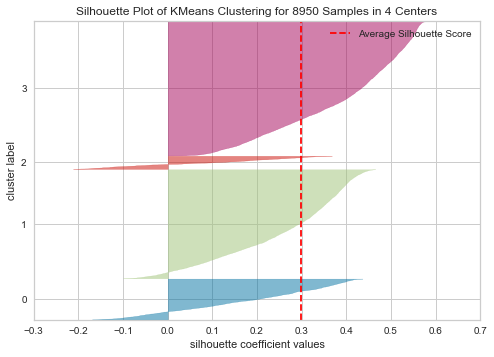

In [19]:
plot_model(km, 'silhouette')

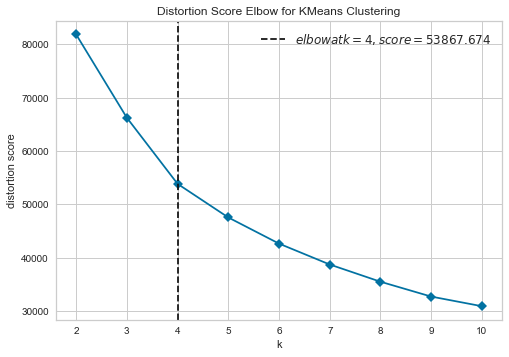

In [15]:
plot_model(km, 'elbow')

In [20]:
plot_model(km, 'distribution')

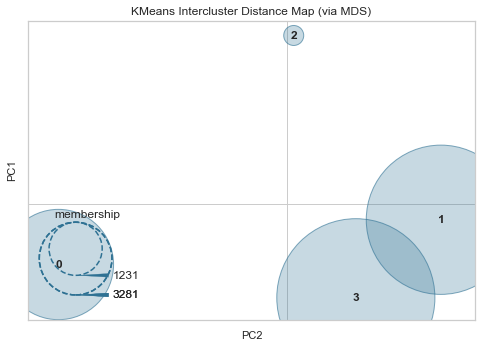

In [21]:
plot_model(km, plot='distance')